# 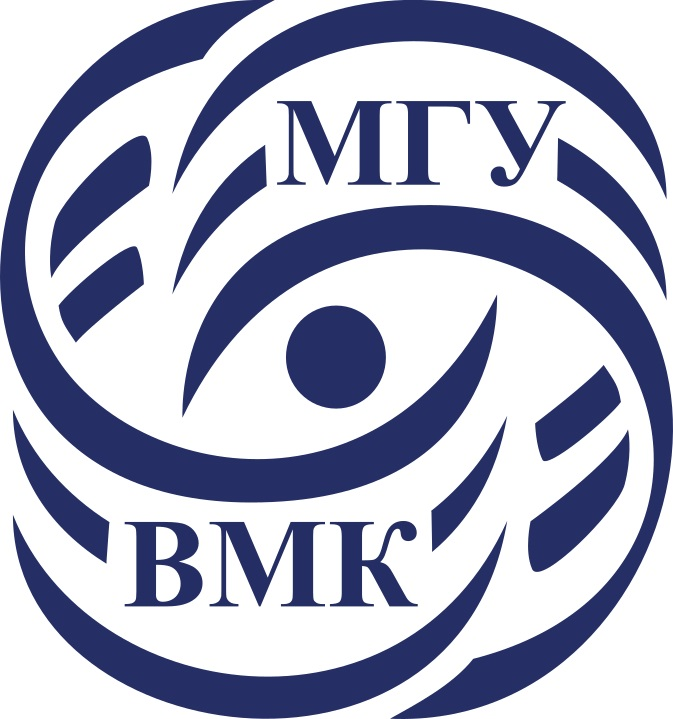

# Машинное обучение. ВМК МГУ

# Практическое задание 9: Кластеризация. Методы снижения размерности.

## Важно! О формате сдачи

* Практически все выделенные задания из ноутбука оцениваются по системе <font color='red'>кросс-рецензирования.</font> Задания, в которых надо реализовать свой код и послать в систему, выделены здесь и в PDF отдельно.
* В этом задании также есть задания по типу <font color='red'>unit-test.</font>
* При решении ноутбука <font color='red'>используйте данный шаблон.</font> Не нужно удалять текстовые ячейки с разметкой частей ноутбука и формулировками заданий. Добавлять свои ячейки, при необходимости, конечно, можно.
* Везде, где в формулировке задания есть <font color='red'>какой-либо вопрос (или просьба вывода),</font> необходимо прописать ответ в ячейку (код или Markdown).
* Наличие <font color='red'>кода решения обязательно.</font> Письменные ответы на вопросы без сопутствующего кода оцениваются в 0 баллов.
* Если в ячейке написана фраза <font color='red'>"Вывод"/"Ответ на вопрос" и.т.д.,</font> то ожидается ответ в виде текста (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если в ячейке написано <font color='red'>"Your code here" и пр. </font>, то ожидается ответ в виде кода (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если есть и ячейка с фразой "Вывод", и ячейка с фразой "Your code here", то в ответе ожидается и код, и текст

**А также..**

Если в ячейке написана фраза `Ваш ответ здесь: (ｏ・_・)ノ”(ノ_<、)`, то ожидается ответ в виде текста (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если в ячейке написано `# Ваш код здесь:＼(º □ º l|l)/`, то ожидается ответ в виде кода (можете добавить ячейки с кодом, если считаете это необходимым, но это необязательно). Если есть и ячейка с фразой `Ваш ответ здесь: (ｏ・_・)ノ”(ノ_<、)`, и ячейка с фразой `# Ваш код здесь:＼(º □ º l|l)/`, то в ответе ожидается и код, и текст)

**В этом задании вы..:**

* Познакомитесь с одним способом визуализации процесса обучения
* Сравните между собой результаты разных способов кластеризации
* Посмотрите и реализуете несколько метрик качества кластеризации
* Попробуете разные методы снижения размерности

<font color=orange><h3>*Примерное время выполнения (execution time/время выполнения, если нажать run all) всех ячеек ноутбука (без ML-решения): 30 минут*</font></h3>

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

Перед началом выполнения переведите ноутбук в `Доверенный режим` (`Trusted`) для корректного отображения изображений:

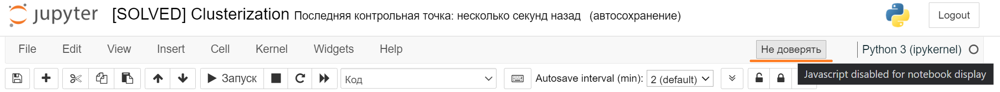

In [ ]:
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='orange'>0. Введение. [кросспроверка 2 балла]</font>

## 0.1 О задании

В данной работе вам предстоит познакомится с методами машинного обучения без учителя — кластеризацией и алгоритмами снижения размерности.

В данном задании предлагается две основных части ($1, 2$) и одна вспомогательная ($0$). Сумарное всемя выполнения ноутбука порядка двух часов при выполнении в сервисах `Kaggle`/`Google Colab`. Рекомендуется использовать Kaggle так как в нём корректно работают интерактивные визуализации.

## 0.2 Необходимые библиотеки

### Установка в Google Colab
Если вы используете Google Colab, то вам достаточно установить библиотеки с помощью ячейки ниже.

После установки нужных версий нажмите на кнопку `Restart runtime`, которая появится в следующей ячейке после завершения ее выполнения.

После перезапуска (`Restart runtime`) устанавливать библиотеки еще раз не нужно, достаточно проверить, что установилась их новая версия.

**Важно!**
Устанавливать нужные версии нужно каждый раз, когда создается новый рантайм. Например, если вы 2 часа подряд делаете это задание, то подготовить библиотеки достаточно 1 раз. Но если вы, например, начали в понедельник, затем закрыли/выключили ноутбук, то при продолжении в среду, вам нужно будет запустить рантайм заново и следовательно заново установить библиотеки.

<font color='red'>**Внимание!**</font> В этом задании мы будем использовать полное виртуальное окружение, так как понадобятся библиотеки `torch` и `tensorflow`

**Обратите внимание, что установка `torch` и `tensorflow` через `pip` может сломать ваше окружение, особенно если вы используете GPU. Выполняйте их установку в соответствии с Вашей конфигурацией системы или в отдельном виртуальном окружении**

In [ ]:
! pip install --upgrade gdown
! gdown 13tID3G5Bd5rKtmUd_s6SvSI_bG3zgmAS
! pip install -r ./requirements_2023_24.txt

In [ ]:
import catboost
assert(catboost.__version__ == '1.2.1')

Здесь перечислены основные функции и библиотеки, которые могут понадобиться Вам в процессе выполнения задания. Подключение других библиотек возможно, но нежелательно. **Работа каких-либо других библиотек не гарантируется.**

In [ ]:
import os

import gdown

import scipy

import numpy as np

import tqdm.auto as tqdm

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from ipywidgets import interactive, fixed, interact_manual, IntSlider, FloatLogSlider, FloatSlider

import torch
from torchvision.datasets import CIFAR10

# Необходима преварительная установка tensorflow
from keras.applications.inception_v3 import InceptionV3, preprocess_input

import sklearn

from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Библиотека umap-learn, а не umap
from umap import UMAP
from sklearn.manifold import TSNE, Isomap

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

## <font color='orange'>0.3 Введение в интерактивные графики jupyter notebook [кросспроверка 2 балла]</font>

Информация об особенностях интерактивных графиков вынесена в отдельный ноутбук `Deep dive into .ipynb.ipynb`. **Ознакомьтесь с ним перед дальнейшим выполнением задания!**

#### **Задание 0.0 [кросспроверка, 2 балла][код, вопрос]**
* Поиграйтесь с интерактивными графиками.
* Посмотрите в чём заключается смысл функций [`interactive`, `interact_manual`, `fixed`, `IntSlider`, `FloatLogSlider`](https://ipywidgets.readthedocs.io/en/latest/examples/Using%20Interact.html).
* Какие ещё [слайдеры и динамические виджеты бывают](https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html)?
* Как вам кажется, удобный ли это инструмент?
* Предложите несколько примеров, когда он мог бы ещё пригодиться.

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
def squared_func(a, b, c):
    fig, ax = plt.subplots(1, 1, figsize=(7, 4))
    x = np.arange(0, 10, 0.1)
    ax.plot(x, a*x*x + b*x + c)
    ax.set_title('График функций $y=ax^2+bx+c$')
    ax.grid(True)
    plt.show()

interactive_plot = interactive(
    squared_func,
    a=FloatSlider(value=1.0, min=-10, max=10, step=0.1, description='a'),
    b=FloatSlider(value=1.0, min=-10, max=10, step=0.1, description='b'),
    c=FloatSlider(value=1.0, min=-50, max=50, step=0.5, description='c'),
)
interactive_plot

interactive(children=(FloatSlider(value=1.0, description='a', max=10.0, min=-10.0), FloatSlider(value=1.0, des…

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)
В анализе данных, для анализа изменения параметров кластеризации данных.
В обучении МЛек. Например, анализ изменения гиперпараметров модели для оптимизации ее работы.

**<font color='red'>Обратите внимание</font>, что динамическое содержимое может некорректно сохраняться в jupyter notebook. Используйте его только для локальной визуализации. Все графики, необходимые для сдачи задания должны быть статическими. Переход в статический режим происходит с помощью магической команды `%matplotlib inline`.**

**<font color='red'>Обязательно убедитесь, что все графики корректно сохранились корректно в ноутбуке перед сдачей в систему.</font>**

In [ ]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

## 0.4 Ещё несколько важных замечаний

При выполнении задания запрещено:
1. Менять те seed, которые явно указаны в коде
2. Менять прототипы функций, классов, методов классов
3. Менять константы, используемые для генерации выборок

При оформлении задания обратите внимание на форматирование кода и на оформление графиков:

* Весь код должен быть оформлен в строгом соответствии с [PEP8](https://pep8.org/)

Графики должны быть с одной стороны понятными и информативными, а с другой стороны *красивыми*. Вот несколько пунктов, которые помогут удовлетворить этим требования:
1. Все графики должны быть отрисованы в **векторном формате**. Обратите внимание, что смена режима графиков с динамического на статический и обратно может приводить к сбросу параметров отрисовки графиков. Переход в векторный режим можно выполнить с помощью команды `matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')`. Если изображения в векторном формате приводят к слишком большому размеру Jupyter Notebook можете использовать растровые изображения с **высоким dpi**. Напирмер, можно установить глобальный dpi в matplotlib: `matplotlib.rcParams['figure.dpi'] = 300`
2. На всех графиках без исключения должна быть нарисована сетка
3. Все графики и группы графиков должны иметь заголовок (`title`)
4. При необходимости оси должны быть подписаны
5. Если на графике отображено несколько сущностей (линии/точки/bar разных цветов, формы и так далее), то необходима исчерпывающая легенда
6. Все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном и так далее)
7. Масштаб по каждой оси на графике должен быть выбран правильно. Используйте масштабы `log`, `symlog` по необходимости
8. Если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах)
9. Частота отметок по каждой оси должна быть тщательно подобрана, по необходимости задавайте `[xy]ticks`, `[xy]ticklabels` вручную. Подписи тиков на осях не должны сливаться как на одной оси, так и между ними
10. Помните, что matplotlib умеет выполнять [рендеринг Latex](https://matplotlib.org/stable/gallery/text_labels_and_annotations/tex_demo.html). Используйте эту возможность для написания формул в заголовках, легенде и в подписях осей
11. Используйте *красивую* цветовую палитру с хорошо различимыми цветами. Примеры цветовых палитр можно посмотреть [здесь](https://matplotlib.org/stable/gallery/color/colormap_reference.html). При наличи особенностей восприятия цвета можно использовать специальные палитры:
```python
plt.style.use('seaborn-colorblind')
# Или
plt.style.use('tableau-colorblind10')
# Затем, при отрисовке графиков не используйте параметр cmap
```
12. Графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='orange'>1. Кластеризация на синтетических данных. [кросспроверка 20 баллов,  unittests 16 баллов]</font>

В данной части мы рассмотрим несколько наборов синтетических данных и сравним как разные алгоритмы кластеризации ведут себя в низкоразмерных и высокоразмерных пространствах

## a. Двумерные данные

Сгенерируем двумерные данные с $4$ естественными кластерами разного размера и плотности.

In [ ]:
data_moons, labels_moons = make_moons(n_samples=300, shuffle=True, noise=0.09, random_state=6417)
data_moons, labels_moons = data_moons[labels_moons == 0], labels_moons[labels_moons == 0]

data_blobs, labels_blobs = make_blobs(
    n_samples=500, n_features=2, centers=[(0, -0.2), (-1.5, -1.5), (-1.5, 1.5)],
    cluster_std=[0.2, 0.4, 0.6], center_box=[-10.0, 10.0],
    shuffle=True, random_state=6417, return_centers=False
)

data = np.concatenate([data_moons, data_blobs])
labels = np.concatenate([labels_moons, labels_blobs + 1])

Определим вспомогательную функцию для отрисовки двумерных кластеризованных данных. При выполенении задания желательно пользоваться этой функцией для визуализации. При необходимости можете менять сигнатуру и поведение функции как вам удобно, _оставляя стиль отрисовки в целом неизменным_.

In [ ]:
def plot_2d_data(data, labels, title='Исходные данные', cmap='tab20', ax=None):
    '''
    Отрисовка 2d scatter plot.
    :param np.ndarray data: 2d массив точек
    :param Union[list, np.ndarray] labels: список меток для каждой точки выборки
    :param str title: Заголовок графика
    :param str cmap: Цветовая палитра
    :param ax Optional[matplotlib.axes.Axes]: Оси для отрисовки графика.
        Если оси не заданы, то создаётся новая фигура и сразу же происходит её отрисовка
        Иначе, график добавляется на существуюущие оси. Отрисовки фигуры не происходит
    '''
    n_clusters = len(np.unique(labels))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    else:
        fig = None

    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels,
        cmap=plt.get_cmap(cmap, n_clusters)
    )

    cbar = plt.colorbar(scatter, label='Номер кластера', ax=ax)
    cbar.set_ticks(np.min(labels) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(np.unique(labels))

    ax.set_title(title)
    ax.grid(True)

    if fig is not None:
        fig.tight_layout()
        plt.show()

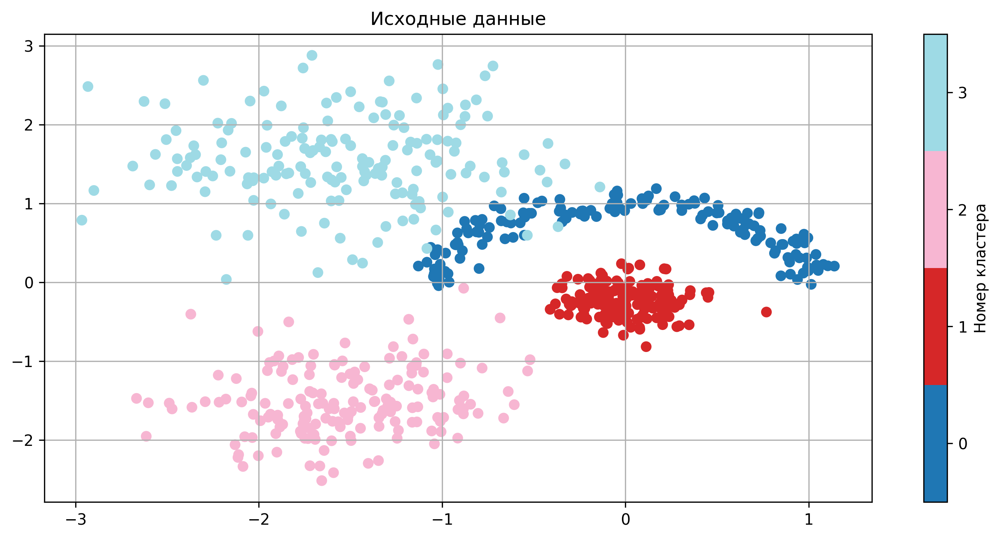

In [ ]:
plot_2d_data(data, labels, title='Исходные данные', cmap='tab20')

#### <font color='orange'>**Задание 1.a.1 [кросспроверка, 3 балла][код]** </font>
<a id='task_1.a.1'></a>
Запустите следующие алгоритмы кластеризации на данной выборке: `KMeans`, `DBSCAN`, `AgglomerativeClustering`. Визуально подберите наилучшие параметры для этих алгоритмов (`n_clusters`, `eps`, `min_samples`, `linkage`). Изобразите наилучшие получившиеся разбиения на графиках.

*Советы:*
1. Можете использовать виджеты для ручного подбора параметров
2. Используйте `plot_2d_data` для отрисовки графиков. Обязательно меняйте заголовок
3. **<font color='red'>Помните, динамический контент может не сохраняться в ноутбуке. Поэтому после подбора оптимальных параметров нарисуйте соответствующий рисунок в статическом режиме</font>**

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
def KMeans_classter(n_clusters):
    model = KMeans(n_clusters=n_clusters, init='k-means++')
    plot_2d_data(data, model.fit_predict(data), title='KMeans', cmap='tab20')

interactive_plot = interactive(
    KMeans_classter,
    n_clusters=IntSlider(value=4, min=1, max=10, step=1, description=r'n_clusters'),
)
interactive_plot

interactive(children=(IntSlider(value=4, description='n_clusters', max=10, min=1), Output()), _dom_classes=('w…

In [ ]:
def DBSCAN_classter(eps, min_samples):
    model = DBSCAN(eps=eps, min_samples=min_samples)
    plot_2d_data(data, model.fit_predict(data), title='DBSCAN', cmap='tab20')

interactive_plot = interactive(
    DBSCAN_classter,
    eps=FloatSlider(value=0.5, min=0.05, max=1.0, step=0.05, description='eps'),
    min_samples=IntSlider(value=5, min=1, max=20, step=1, description='min_samples'),
)
interactive_plot

interactive(children=(FloatSlider(value=0.5, description='eps', max=1.0, min=0.05, step=0.05), IntSlider(value…

In [ ]:
from ipywidgets import ToggleButtons

def AgglomerativeClustering_classter(n_clusters, linkage):
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    plot_2d_data(data, model.fit_predict(data), title='AgglomerativeClustering_classter', cmap='tab20')

interactive_plot = interactive(
    AgglomerativeClustering_classter,
    n_clusters=IntSlider(value=4, min=1, max=10, step=1, description='n_clusters'),
    linkage=ToggleButtons(options=['ward', 'complete', 'average', 'single'], description='linkage')
)
interactive_plot

interactive(children=(IntSlider(value=4, description='n_clusters', max=10, min=1), ToggleButtons(description='…

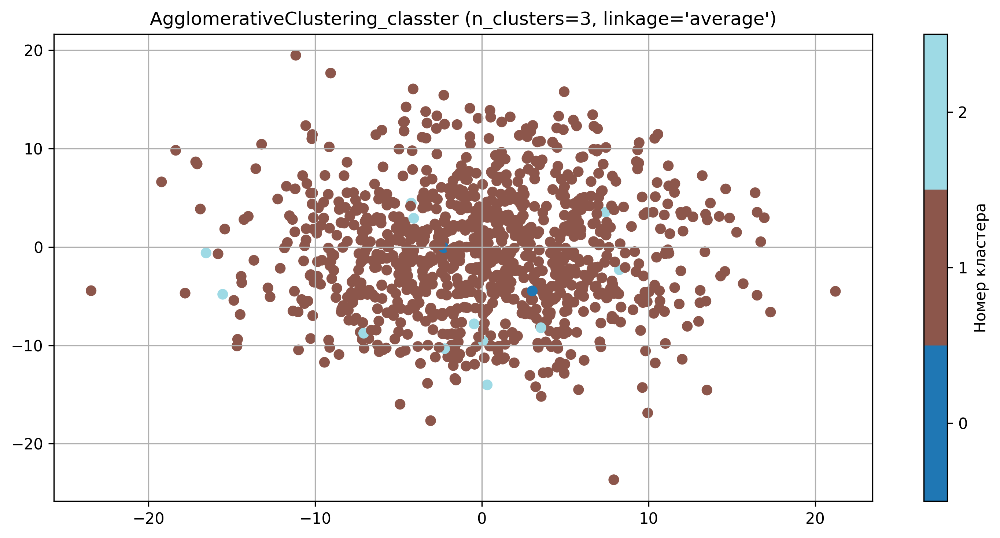

In [ ]:
plot_2d_data(data, AgglomerativeClustering(n_clusters=3, linkage='average').fit_predict(data), title='AgglomerativeClustering_classter (n_clusters=3, linkage=\'average\')', cmap='tab20')

#### <font color='orange'>**Задание 1.a.2 [кросспроверка, 2 балла][вопрос]**</font>
Основываясь на знании о работе данных алгоритмов, объясните, почему кластеры были сформированы таким образом. Какой алгоритм лучше всего работает на предложенных данных?

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)
Наилучшие результаты показал алгоритм DBSCAN. В целом, кластеры имеют сложную структуру: KMeans не смог эффективно выполнить кластеризацию из-за невыпуклости данных, DBSCAN столкнулся с проблемой различной плотности кластеров, а AgglomerativeClustering - с комбинацией невыпуклости и различной плотности.

## b. Многомерные данные. Снижение размерности

Теперь попробуем кластеризовать данные в высокоразмерном пространстве. Существенным отличием от двумерного случая является невозможность прямой визуальной оценки кластеризации.

Одним из наглядных способов оценки кластеризации является снижение размерности. В данной части вам предлагается использовать алгоритм `TSNE` для визуализации данных.

In [ ]:
data, labels = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=5, n_clusters_per_class=2, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)

####<font color='orange'>**Задание 1.b.1 [кросспроверка, 2 балла][код, вопрос]**</font>
Примените алгоритм `TSNE` для снижения размерности до двух. Учтите, что `TSNE` суть есть метрический алгоритм и существенно зависит от масштаба признаков — некорректный и различающийся масштаб признаков гарантированно приведёт к неинтерпретируемым результатам. Можете попробовать подобрать гиперпараметры алгоритма для получения лучшей визуализации.

Изобразите получившиеся низкоразмерные вектора. Получилось ли сохранить кластеры при переходе в низкоразмерное пространство?

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
def plt_TSNE(perplexity):
    data_scaled = StandardScaler().fit_transform(data)
    plot_2d_data(TSNE(n_components=2, perplexity=perplexity).fit_transform(data_scaled), labels, title='TSNE', cmap='tab20')

interactive_plot = interactive(
    plt_TSNE,
    perplexity=IntSlider(value=30, min=0, max=200, step=1, description='perplexity')
)
interactive_plot

interactive(children=(IntSlider(value=30, description='perplexity', max=200), Output()), _dom_classes=('widget…

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)
Не удалось сохранить кластеры в удовлетворительном виде. После применения TSNE кластеры частично сгруппировались, однако они остаются разделенными и некоторые из них находятся на значительном удалении друг от друга.

#### <font color='orange'>**Задание 1.b.2 [кросспроверка, 3 балла][код]**</font>
Примените алгоритмы кластеризации из предыдущего пункта к новым данным. Изобразите получившиеся кластеры в векторном пространстве, полученном с помощью `TSNE`. Не забудьте подобрать оптимальные параметры (те же, что и в пункте [**1.a.1**](#task_1.a.1)) для всех алгоритмов. Помните, что большинство алгоритмов кластеризации также являются метрическими и существенно зависят от масштаба признаков.

*Замечание:* Обратите внимание, что применять алгоритмы кластеризации нужно к высокоразмерным векторам, а низкоразмерные вектора необходимо использовать только для визуализации.

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
def KMeans_TSNE(data, n_clusters):
    data_scaled = StandardScaler().fit_transform(data)
    data_TSNE = TSNE(n_components=2, perplexity=30).fit_transform(data_scaled)
    model = KMeans(n_clusters=n_clusters, init='k-means++')
    plot_2d_data(data_TSNE, model.fit_predict(data_scaled), title='KMeans TSNE', cmap='tab20')

interactive_plot = interactive(
    KMeans_TSNE,
    data=fixed(data),
    n_clusters=IntSlider(value=4, min=1, max=10, step=1, description=r'n_clusters')
)
interactive_plot

interactive(children=(IntSlider(value=4, description='n_clusters', max=10, min=1), Output()), _dom_classes=('w…

In [ ]:
def DBSCAN_TSNE(data, eps, min_samples):
    data_scaled = StandardScaler().fit_transform(data)
    data_TSNE = TSNE(n_components=2, perplexity=30).fit_transform(data_scaled)
    model = DBSCAN(eps=eps, min_samples=min_samples)
    plot_2d_data(data_TSNE, model.fit_predict(data_scaled), title='DBSCAN TSNE', cmap='tab20')

interactive_plot = interactive(
    DBSCAN_TSNE,
    data=fixed(data),
    eps=FloatSlider(value=0.5, min=0.05, max=1.0, step=0.05, description='eps'),
    min_samples=IntSlider(value=5, min=1, max=20, step=1, description='min_samples'),
)
interactive_plot

interactive(children=(FloatSlider(value=0.5, description='eps', max=1.0, min=0.05, step=0.05), IntSlider(value…

In [ ]:
def AgglomerativeClustering_TSNE(data, n_clusters, linkage):
    data_scaled = StandardScaler().fit_transform(data)
    data_TSNE = TSNE(n_components=2, perplexity=30).fit_transform(data_scaled)
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    plot_2d_data(data_TSNE, model.fit_predict(data_scaled), title='AgglomerativeClustering_classter TSNE', cmap='tab20')

interactive_plot = interactive(
    AgglomerativeClustering_TSNE,
    data=fixed(data),
    n_clusters=IntSlider(value=4, min=1, max=10, step=1, description='n_clusters'),
    linkage=ToggleButtons(options=['ward', 'complete', 'average', 'single'], description='linkage')
)
interactive_plot

#### <font color='orange'>**Задание 1.b.3 [кросспроверка, 2 балла][вопрос]**</font>
Опишите получившиеся результаты. Все ли алгоритмы одинаково хорошо разделяют данные? Если какой-то алгоритм не справился с задачей, то предположите почему.

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)
Каждый алгоритм кластеризации дает свой результат. Визуально наиболее качественные результаты показал AgglomerativeClustering по сравнению с исходными метками. Наименее эффективным оказался DBSCAN, вероятно, из-за сложности подбора параметров и гиперпараметров для конкретной задачи.

## c. Методы оценки кластеризации. Внутренние и внешние метрики.

Визуальная оценка кластеризации при работе с высокоразмерными данными затруднительна, так как существенно зависит от выбранного метода снижения размерности, который может плохо работать на конкретных данных. С другой стороны, визуальная оценка — субъективна. Поэтому необходимы численные оценки качества кластеризации.

В данном разделе вам нужно будет реализовать две метрики кластеризации и проверить их на практике.

Существует два основных подхода к оценке кластеризации — внутренние и внешние метрики. Первые используют только информацию о векторах-признаках объектов и метки кластеров, полученные из алгоритма кластеризации. Внешние же, используют информацию об истинной разметке объектов.

### Silhouette

Метрика `силуэт` является классическим представителем внутренних метрик кластеризации. Её суть заключается в оценке двух параметров, характеризующих выделенные кластеры — компактность и отделимость.

Положим, что $C_{i}$ — номер кластера для объекта $i$.

$s_{i}$ — компактность кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов того же кластера:
$$s_{i} = \frac{1}{|\{j : C_{j} = C_{i}\}| - 1} \sum\limits_{j : C_{j} = C_{i}} || x_{i} - x_{j} ||$$

$d_{i}$ — отделимость кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов второго по близости кластера:
$$ d_{i} = \min_{C: C \neq C_{i}} \frac{1}{|\{j : C_{j} = C\}|} \sum\limits_{j : C_{j} = C} || x_{i} - x_{j} || $$

Тогда силуэт объекта $i$:
$$\text{sil}_{i} = \frac{d_{i} - s_{i}}{\max(d_{i},s_{i})}$$

И, наконец, коэффициент силуэта для выборки определяется как среднее силуэтов объектов:
$$S = \frac{1}{|X|}\sum\limits_{i} \text{sil}_{i}$$

Если кластер состоит из одного объекта, то его силуэт равен нулю.

#### <font color='orange'>**Задание 1.с.1 [unittests, 8 баллов]**</font>
Реализуйте вычисление коэффициента силуэта для заданного разбиения. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов
2. Используйте не более одного цикла
3. Учтите, что метки кластеров могут идти не по порядку и принимать произвольные значения
4. Если в данных присутствует один кластер, то считайте что силуэт равен 0
5. Если $s_{i} = d_{i} = 0 \Longrightarrow \text{sil}_{i} = 0$
5. Разрешено использовать `sklearn.metrics.pairwise_distances` и аналоги
6. Запрещено использовать любые библиотечные реализации коэффициента силуэта

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов $n \le 3000$, размерность пространства $d \le 1200$
2. Число объектов $n \le 5000$, размерность пространства $d = 1$

**Несколько важных замечаний:**

**Замечание:** Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

**Замечание:** Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

**Замечание:** Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

**Замечание:** Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook (смотрите [**тесты для Силуэта**](#task_1.c.1)).

In [ ]:
def silhouette_score(x, labels):
    '''
    :param np.ndarray x: Непустой двумерный массив векторов-признаков
    :param np.ndarray labels: Непустой одномерный массив меток объектов
    :return float: Коэффициент силуэта для выборки x с метками labels
    '''

    # Ваш код здесь:＼(º □ º l|l)/
    distance_matrix = sklearn.metrics.pairwise_distances(x)
    num_clusters, count_clusters = np.unique(labels, return_counts=True)
    len_labels = len(labels)
    if len(num_clusters) <= 1:
        return 0
    masks = np.zeros((len_labels, len(num_clusters))).astype(bool)
    sum_dists = np.zeros((len_labels, len(num_clusters)))
    sizes_clusters = np.zeros(len_labels)
    for i, cluster in enumerate(num_clusters):
        masks[:, i] = labels == cluster
        sum_dists[:, i] = np.sum(distance_matrix[:, labels == cluster], axis=1)
        sizes_clusters[labels == cluster] = np.sum(labels == cluster)
    one_elem_cl = sizes_clusters == 1
    s = sum_dists[masks]
    s[one_elem_cl] = 0
    s[~one_elem_cl] /= (sizes_clusters[~one_elem_cl] - 1)
    d = np.min(((sum_dists / count_clusters)[~masks]).reshape(len_labels, -1), axis=1)
    d[one_elem_cl] = 0
    ans = np.zeros(len_labels)
    maxs = np.maximum(s, d)
    np.divide(d - s, maxs, out=ans, where=(maxs != 0))
    return np.mean(ans)

#### <font color='orange'>**Задание 1.c.2 [кросспроверка, 4 балла][код, вопрос]**</font>
Посчитайте аналитически коэффициенты силуэта для объектов из примера ниже. Посчитайте силуэт аналитически и сравните его с выводом Вашей функции `silhouette_score`.

*Замечание:* Приведите подробные выкладки с использованием $\LaTeX$ (включая значения $s_{i}, d_{i}$). Используйте те же обозначения, что и в теоретической справке выше. Итоговый ответ для силуэта запишите с точностью три знака после запятой.

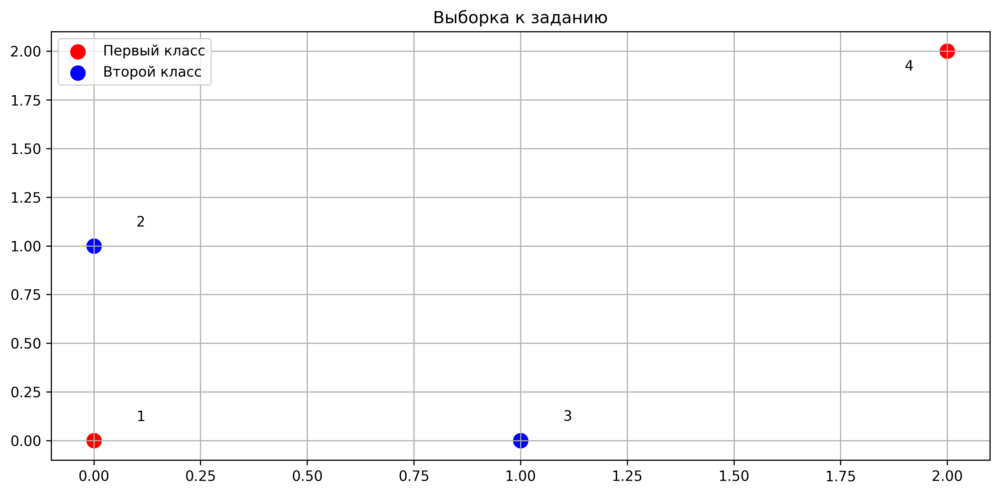

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.scatter([0, 2], [0, 2], s=100, c='r', label='Первый класс')
ax.scatter([0, 1], [1, 0], s=100, c='b', label='Второй класс')

ax.annotate('1', (0.1, 0.1))
ax.annotate('2', (0.1, 1.1))
ax.annotate('3', (1.1, 0.1))
ax.annotate('4', (1.9, 1.9))

ax.set_title('Выборка к заданию')
ax.grid(True)
ax.legend()

fig.tight_layout()
plt.show()

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)
Первый силуэт объекта: \\
$s_1 = \frac{1}{2 - 1}(0 + \sqrt{2^2 + 2^2}) = \sqrt{8}$ \\
$d_1 = \frac{1}{2}(1 + 1) = 1$ \\
$sil_1 = \frac{1 - \sqrt{8}}{\max(1, \sqrt{8})} = -0.646$

Второй силуэт объекта: \\
$s_2 = \frac{1}{2 - 1}(0 + \sqrt{1^2 + 1^2}) = \sqrt{2}$ \\
$d_2 = \frac{1}{2}(1 + \sqrt{2^2 + 1^2}) = \frac{1 + \sqrt{5}}{2}$ \\
$sil_2 = \frac{\frac{1 + \sqrt{5}}{2} - \sqrt{2}}{\max(\frac{1 + \sqrt{5}}{2}, \sqrt{2})}$ =  0.126

Третий силуэт объекта: \\
$s_3 = \frac{1}{2 - 1}(0 + \sqrt{1^2 + 1^2}) = \sqrt{2}$ \\
$d_3 = \frac{1}{2}(1 + \sqrt{1^2 + 2^2}) = \frac{1 + \sqrt{5}}{2}$ \\
$sil_3 = \frac{\frac{1 + \sqrt{5}}{2} - \sqrt{2}}{\max(\frac{1 + \sqrt{5}}{2}, \sqrt{2})}$ =  0.126

Четвёртый силуэт объекта: \\
$s_4 = \frac{1}{2 - 1}(0 + \sqrt{2^2 + 2^2}) = \sqrt{8}$ \\
$d_4 = \frac{1}{2}(\sqrt{2^2 + 1^2} + \sqrt{1^2 + 2^2}) = \sqrt{5}$ \\
$sil_4 = \frac{\sqrt{5} - \sqrt{8}}{\max(\sqrt{5}, \sqrt{8})}$ =  -0.21

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
print("Silhouette Score = ", silhouette_score(np.array([[0, 0.], [0, 1], [1, 0], [2, 2]]), np.array([1, 0, 0, 1])))

Silhouette Score =  -0.15098532303997897


<a id='task_1.c.1'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [ ]:
assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2]]), np.array([1, 0, 0, 1])
    ),
    np.mean([-0.64644661,  0.12596795,  0.12596795, -0.20943058])
)

assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2], [1, 1], [2, 0]]), np.array([1, 0, 0, 1, 2, 2])
    ),
    np.mean([-0.64644661,  0.12596795, -0.29289322, -0.39644661, -0.29289322, 0.12596795])
)

### B-Cubed

Пусть существует разметка $(y_1, ... , y_l)$, не участвующая в обучении. Мы не использовали эту разметку в качестве дополнительного признака, так как нам не хочется мотивировать модель данным признаком. Тогда предлагается ввести оценку качества алгоритма кластеризации при помощи внешней разметки, саму же разметку тогда называют *gold standard*.

Один из вариантов учесть gold standard разметку — внешняя метрика B-Cubed. Данная метрика позволяет определять следующие особенности кластеризации:
1. **Гомогенность.** Базовое свойство разделения разных объектов в разные кластеры:




2. **Полнота.** Один кластер не должен дробиться на несколько маленьких:



3. **Rag-bag.** Весь мусор должен быть в одном "мусорном"кластере, чтобы остальные кластеры были "чистыми":



4. **Cluster size vs. quantity.** Лучше испортить один кластер с целью улучшить качество множества других:



Пусть $L(x)$ — gold standard, $C(x)$ — номер кластера, выдаваемый рассматриваемым алгоритмом.

Рассмотрим несколько величин:
$$
\text{Correctness}(x, x^{\prime}) = \begin{cases}
1 , C(x) = C(x^{\prime}) ∧ L(x) = L(x^{\prime})\\
0 , иначе
\end{cases}
$$
$$
\text{Precision-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:C(x)=C(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$
$$
\text{Recall-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:L(x)=L(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$

Тогда,
$$
\text{B-Cubed} = F_{1} = 2\frac{\text{Precision-BCubed}\times\text{Recall-BCubed}}{\text{Precision-BCubed}+\text{Recall-BCubed}}
$$

#### <font color='orange'>**Задание 1.с.3 [unittests, 8 баллов]**</font>
Реализуйте вычисление метрики B-Cubed. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов.
2. Использование циклов запрещено
3. Обратите внимание на параметр `where` у функций-агрегаторов в `numpy` ($numpy \geq 1.20.0$).
4. Запрещено использовать любые библиотечные реализации B-Cubed.

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов n ⩽ 1000, число подтестов в одном тесте T ⩽ 70

**Несколько важных замечаний:**

**Замечание:** Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

**Замечание:** Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

**Замечание:** Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

**Замечание:** Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook (смотрите [**тесты для B-Cubed**](#task_1.c.3)).

In [ ]:
def bcubed_score(true_labels, predicted_labels):
    '''
    :param np.ndarray true_labels: Непустой одномерный массив меток объектов
    :param np.ndarray predicted_labels: Непустой одномерный массив меток объектов
    :return float: B-Cubed для объектов с истинными метками true_labels и предсказанными метками predicted_labels
    '''

    # Ваш код здесь:＼(º □ º l|l)/

    true_uniq, true_inv, true_count = np.unique(true_labels, return_inverse=True, return_counts=True)
    pred_uniq, pred_inv, pred_count = np.unique(predicted_labels, return_inverse=True, return_counts=True)
    true_labels[true_labels == 0] = true_uniq[-1] + 1
    predicted_labels[predicted_labels == 0] = pred_uniq[-1] + 1
    correctness = np.ones((len(true_labels), len(true_labels)))
    correctness[(true_labels / true_labels[:, None]) != 1] = 0
    correctness[(predicted_labels / predicted_labels[:, None]) != 1] = 0
    prec = np.mean(np.sum(correctness, axis=1) / pred_count[pred_inv])
    recall = np.mean(np.sum(correctness, axis=1) / true_count[true_inv])
    return 2 * prec * recall / (prec + recall)

<a id='task_1.c.3'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [ ]:
assert np.allclose(bcubed_score(np.array([1]), np.array([1])), 1.0)
assert np.allclose(bcubed_score(np.array([1]), np.array([2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 1])), 2. / 3)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([43, 12])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 1, 2, 2]), np.array([1, 1, 1, 2])), 12. / 17)
assert np.allclose(bcubed_score(np.array([1, 2, 3, 4, 5]), np.array([1, 1, 1, 2, 2])), 4. / 7)

#### <font color='orange'>**Задание 1.с.4 [кросспроверка, 4 балла][код, вопрос]** </font>
<a id='task_1.c.4'></a>
* Для каждого из трёх алгоритмов кластеризации переберите основные параметры (`n_clusters`, `eps`, `min_samples`) и замерьте качество кластеризации многомерных данных с помощью коэффициента силуэта и метрики B-Cubed.
* Для каждого из алгоритмов на одной фигуре изобразите четыре графика — в первой строке два графика с зависимостью коэффициента силуэта и метрики B-Cubed от варьируемого параметра. Во второй строке — визуализация кластеризации с оптимальным параметром, выбранным с помощью первой и второй метрики (можете использовать `plot_2d_data` с параметром `ax`). Для DBSCAN перебирайте оба параметра одновременно и изобразите 2d-heatmap для каждой из метрик. Можете использовать [вспомогательные функции для создания heatmap](https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html).
* Совпали ли оптимальные параметры, определённые по этим метрикам? Совпали ли они с теми параметрами которые вы подобрали в предыдущем задании? Предположите почему они совпали/не совпали.
* Можно ли использовать данные метрики для оценки кластеризации между разными алгоритмами? Какая из них лучше отражает качество?

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


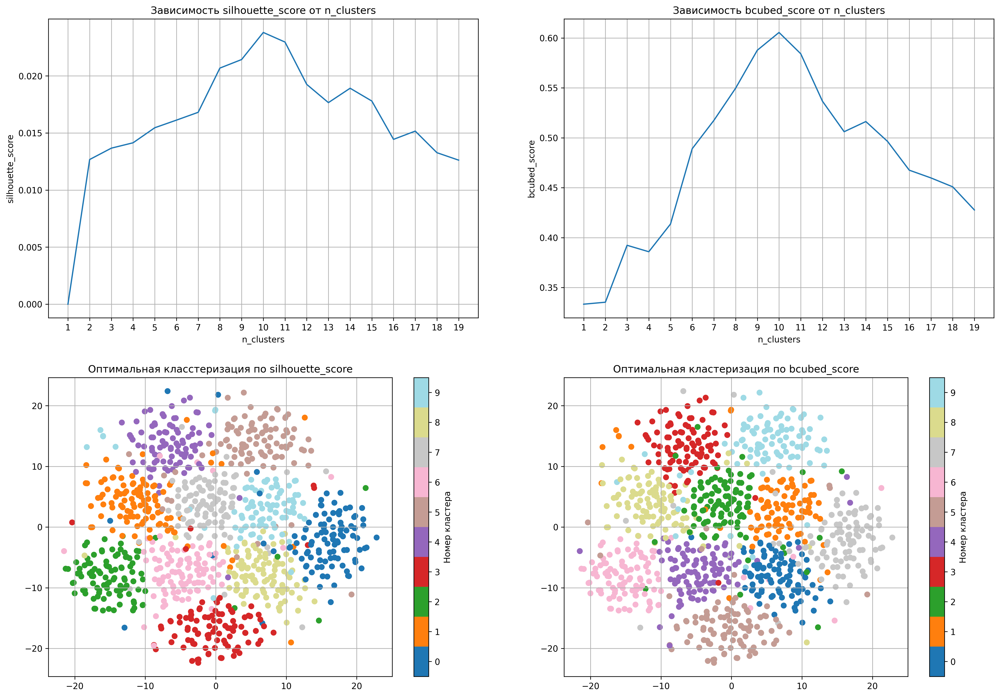

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
data_scaled = StandardScaler().fit_transform(data)
data_TSNE = TSNE(n_components=2, perplexity=30).fit_transform(data_scaled)

n_clusters = [col for col in range(1, 20)]
sil_scores = []
bcubed_scores = []
for i in n_clusters:
    sil_scores.append(silhouette_score(data_scaled, KMeans(n_clusters=i, n_init=10).fit_predict(data_scaled)))
    bcubed_scores.append(bcubed_score(labels, KMeans(n_clusters=i, n_init=10).fit_predict(data_scaled)))

fig, ax = plt.subplots(2, 2, figsize=(20, 14))
ax[0, 0].plot(n_clusters, sil_scores)
ax[0, 0].set_title('Зависимость silhouette_score от n_clusters')
ax[0, 0].set_xlabel('n_clusters')
ax[0, 0].set_ylabel('silhouette_score')
ax[0, 0].set_xticks(n_clusters)
ax[0, 0].grid()

ax[0, 1].plot(n_clusters, bcubed_scores)
ax[0, 1].set_title('Зависимость bcubed_score от n_clusters')
ax[0, 1].set_xlabel('n_clusters')
ax[0, 1].set_ylabel('bcubed_score')
ax[0, 1].set_xticks(n_clusters)
ax[0, 1].grid()

plot_2d_data(data_TSNE, KMeans(n_clusters=10).fit_predict(data_scaled), title='Оптимальная класстеризация по silhouette_score', ax=ax[1, 0])
plot_2d_data(data_TSNE, KMeans(n_clusters=10).fit_predict(data_scaled), title='Оптимальная кластеризация по bcubed_score', ax=ax[1, 1])

plt.show()

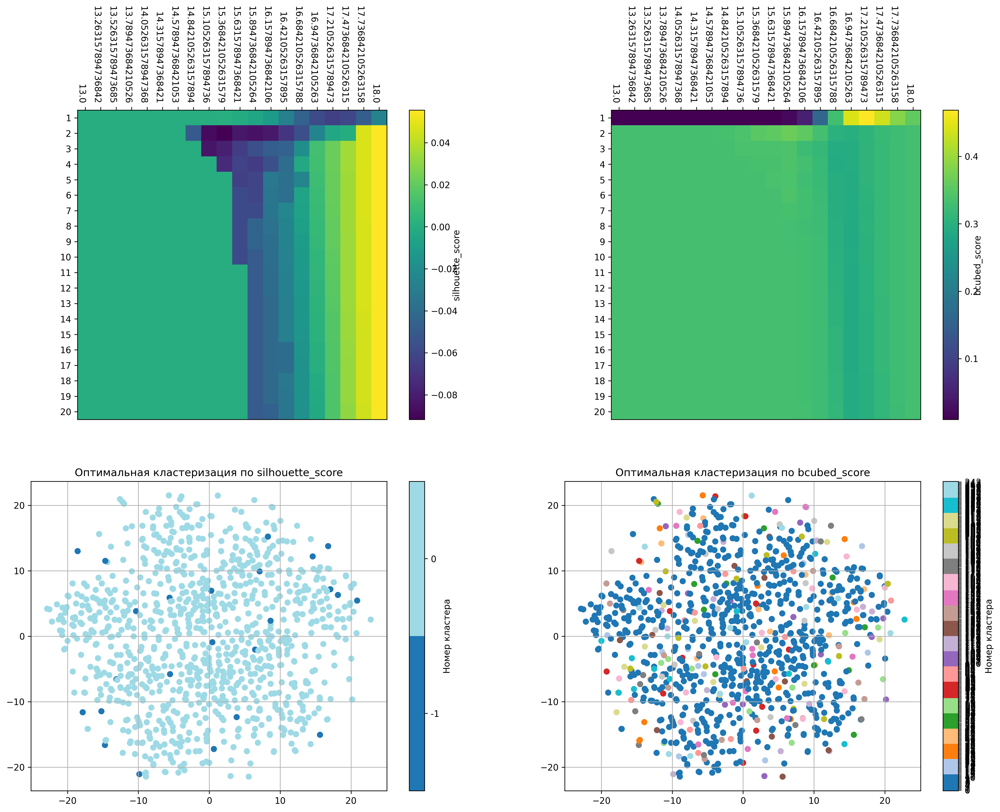

In [ ]:
#DBSCAN
eps = np.linspace(start=13, stop=18, num=20)
min_samples = [n for n in range(1, 21)]

sil_scores = []
bcubed_scores = []
for i, ms in enumerate(min_samples):
    sil_scores.append([])
    bcubed_scores.append([])
    for j in eps:
        sil_scores[i].append(silhouette_score(data_scaled, DBSCAN(eps=j, min_samples=ms).fit_predict(data_scaled)))
        bcubed_scores[i].append(bcubed_score(labels, DBSCAN(eps=j, min_samples=ms).fit_predict(data_scaled)))

def plot_heatmap(data, labels_x, labels_y, ax, bar_text):
    data = np.array(data)
    im = ax.imshow(data)
    ax.set_xticks(np.arange(data.shape[1]), labels=labels_x)
    ax.set_yticks(np.arange(data.shape[0]), labels=labels_y)
    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel(bar_text, va="bottom")
    plt.setp(ax.get_xticklabels(), rotation=-90, ha="right")

fig, ax = plt.subplots(2, 2, figsize=(20, 14))
plot_heatmap(sil_scores, eps, min_samples, ax[0, 0], 'silhouette_score')
plot_heatmap(bcubed_scores, eps, min_samples, ax[0, 1], 'bcubed_score')
plot_2d_data(data_TSNE, DBSCAN(eps=18, min_samples=10).fit_predict(data_scaled), title='Оптимальная кластеризация по silhouette_score', ax=ax[1,0])
plot_2d_data(data_TSNE, DBSCAN(eps=17.21, min_samples=1).fit_predict(data_scaled), title='Оптимальная кластеризация по bcubed_score', ax=ax[1,1])
plt.show()

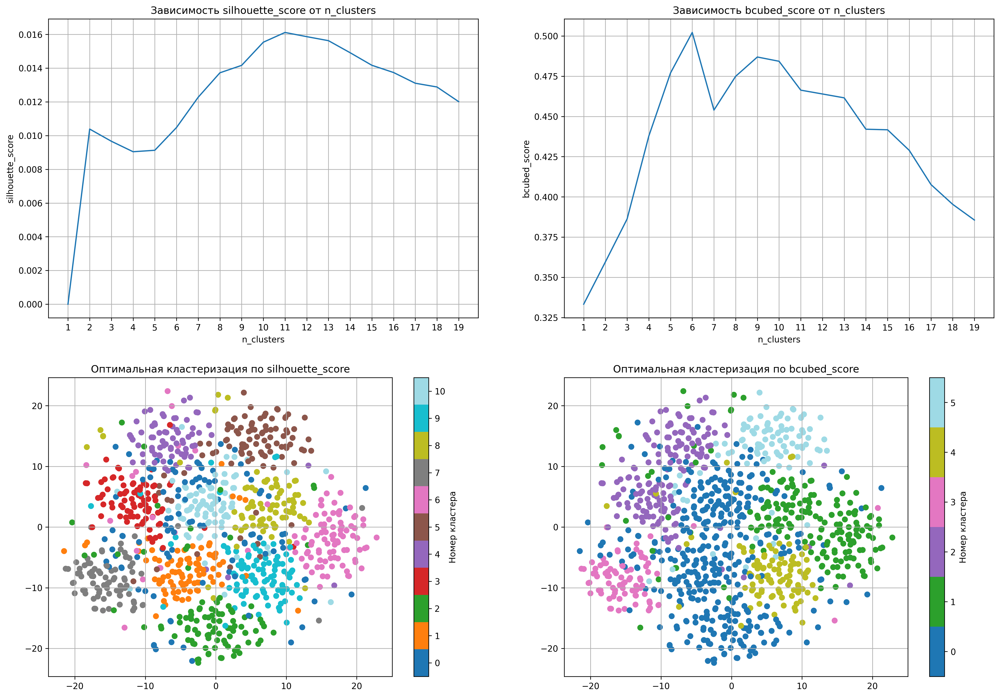

In [ ]:
n_clusters = [col for col in range(1, 20)]
sil_scores = []
bcubed_scores = []
for i in n_clusters:
    sil_scores.append(silhouette_score(data_scaled, AgglomerativeClustering(n_clusters=i).fit_predict(data_scaled)))
    bcubed_scores.append(bcubed_score(labels, AgglomerativeClustering(n_clusters=i).fit_predict(data_scaled)))

fig, ax = plt.subplots(2, 2, figsize=(20, 14))
ax[0, 0].plot(n_clusters, sil_scores)
ax[0, 0].set_title('Зависимость silhouette_score от n_clusters')
ax[0, 0].set_xlabel('n_clusters')
ax[0, 0].set_ylabel('silhouette_score')
ax[0, 0].set_xticks(n_clusters)
ax[0, 0].grid()

ax[0, 1].plot(n_clusters, bcubed_scores)
ax[0, 1].set_title('Зависимость bcubed_score от n_clusters')
ax[0, 1].set_xlabel('n_clusters')
ax[0, 1].set_ylabel('bcubed_score')
ax[0, 1].set_xticks(n_clusters)
ax[0, 1].grid()

plot_2d_data(data_TSNE, AgglomerativeClustering(n_clusters=11).fit_predict(data_scaled), title='Оптимальная кластеризация по silhouette_score', ax=ax[1,0])
plot_2d_data(data_TSNE, AgglomerativeClustering(n_clusters=6).fit_predict(data_scaled), title='Оптимальная кластеризация по bcubed_score', ax=ax[1,1])

plt.show()

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)
Оптимальные параметры значительно отличаются от тех, которые были выбраны в предыдущем задании. Очевидно, что подбор параметров на основе визуального анализа и с использованием метрик дают разные результаты.

В целом, можно использовать эти алгоритмы для сравнения между моделями. На мой взгляд, наиболее качественно качество кластеризации определяет внешняя метрика Bcubed, которая позволяет оценить соответствие кластеров исходным меткам.

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='orange'>2. Кластеризация "естественных" данных.   [кросспроверка 22 балла]</font>

Синтетические данные имеют достаточно простую структуру, поэтому методы снижения размерности позволяют получать хорошее низкоразмерное представление с достаточно выраженными кластерами. Однако, реальные данные могут быть устроены существенно сложнее. Посмотрим как поведут себя методы снижения размерности на датасете с картинками CIFAR10.

Загрузим датасет. Будем использовать только часть обучающей выборки, чтобы ускорить вычисления на высокоразмерных данных.

In [ ]:
cifar10_test_dataset = CIFAR10('./cifar10', train=False, download=True)
cifar10_train_dataset = CIFAR10('./cifar10', train=True, download=False)

cifar10_labels_test = np.array(cifar10_test_dataset.targets)
cifar10_labels_train = np.array(cifar10_train_dataset.targets)

cifar10_images_test = cifar10_test_dataset.data
cifar10_images_train = cifar10_train_dataset.data

cifar10_images_train, _, cifar10_labels_train, _ = train_test_split(
    cifar10_images_train, cifar10_labels_train,
    train_size=cifar10_images_test.shape[0], stratify=cifar10_labels_train, random_state=6886
)

cifar10_data_test = (cifar10_images_test.astype(np.float32) / 255.0).reshape([cifar10_images_test.shape[0], -1])
cifar10_data_train = (cifar10_images_train.astype(np.float32) / 255.0).reshape([cifar10_images_train.shape[0], -1])

Отобразим данные в проекции на две случайные оси. Для удобства воспользуемся здесь ещё одним вариантом динамического контента в jupyter notebook — при наведении на точку на графике будем отображать исходную картинку.

In [ ]:
def plot_interactive(lowd_data, images, labels, names, n_dots=1000, image_scale=1.0):
    with matplotlib.rc_context(rc={
        'font.size': image_scale * matplotlib.rcParams['font.size'],
        'xtick.major.size': image_scale * matplotlib.rcParams['xtick.major.size'],
        'xtick.minor.size': image_scale * matplotlib.rcParams['xtick.minor.size'],
        'ytick.major.size': image_scale * matplotlib.rcParams['ytick.major.size'],
        'ytick.minor.size': image_scale * matplotlib.rcParams['ytick.minor.size'],

        'axes.linewidth': image_scale * matplotlib.rcParams['axes.linewidth'],
        'grid.linewidth': image_scale * matplotlib.rcParams['grid.linewidth'],
        'patch.linewidth': image_scale * matplotlib.rcParams['patch.linewidth'],
        'xtick.major.width': image_scale * matplotlib.rcParams['xtick.major.width'],
        'xtick.minor.width': image_scale * matplotlib.rcParams['xtick.minor.width'],
        'ytick.major.width': image_scale * matplotlib.rcParams['ytick.major.width'],
        'ytick.minor.width': image_scale * matplotlib.rcParams['ytick.minor.width'],

        'lines.markeredgewidth': image_scale * matplotlib.rcParams['lines.markeredgewidth'],
    }):
        fig, ax = plt.subplots(1, 1, figsize=(image_scale * 10, image_scale * 5))
        fig.set_dpi(300)
        ax.grid(True)

        n_clusters = len(np.unique(labels))

        scatter = plt.scatter(
            lowd_data[:n_dots, 0], lowd_data[:n_dots, 1], s=image_scale * 10,
            c=labels[:n_dots], cmap=plt.get_cmap('tab20', n_clusters), edgecolors='none'
        )

        cbar = plt.colorbar(scatter, ax=ax, label='Название кластера')
        cbar.set_ticks(np.min(labels[:n_dots]) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
        cbar.set_ticklabels(names)

        offset_image = OffsetImage(images[0], zoom=image_scale * 2.0)
        ann_bbox = AnnotationBbox(
            offset_image, (0,0), xybox=(image_scale * 50., image_scale * 50.), xycoords='data',
            boxcoords="offset points", pad=0.3, arrowprops=dict(
                arrowstyle='->, head_length={0:.2f}, head_width={1:.2f}'.format(
                    image_scale * 0.4, image_scale * 0.2
                )
            )
        )
        ax.add_artist(ann_bbox)
        ax.set_title('Распределение данных CIFAR10 в проекции на 2 случайные оси')
        ann_bbox.set_visible(False)

        def image_hover(event):
            if scatter.contains(event)[0]:
                ind, *_ = scatter.contains(event)[1]["ind"]
                w, h = fig.get_size_inches() * fig.dpi
                ws = (event.x > w / 2.) * -1 + (event.x <= w / 2.)
                hs = (event.y > h / 2.) * -1 + (event.y <= h / 2.)
                ann_bbox.xybox = (image_scale * 50.0 * ws, image_scale * 50.0 * hs)
                ann_bbox.set_visible(True)
                ann_bbox.xy =(lowd_data[ind, 0], lowd_data[ind, 1])
                offset_image.set_data(images[ind])
            else:
                ann_bbox.set_visible(False)
            fig.canvas.draw_idle()

        fig.canvas.mpl_connect('motion_notify_event', image_hover)

        plt.show()

In [ ]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

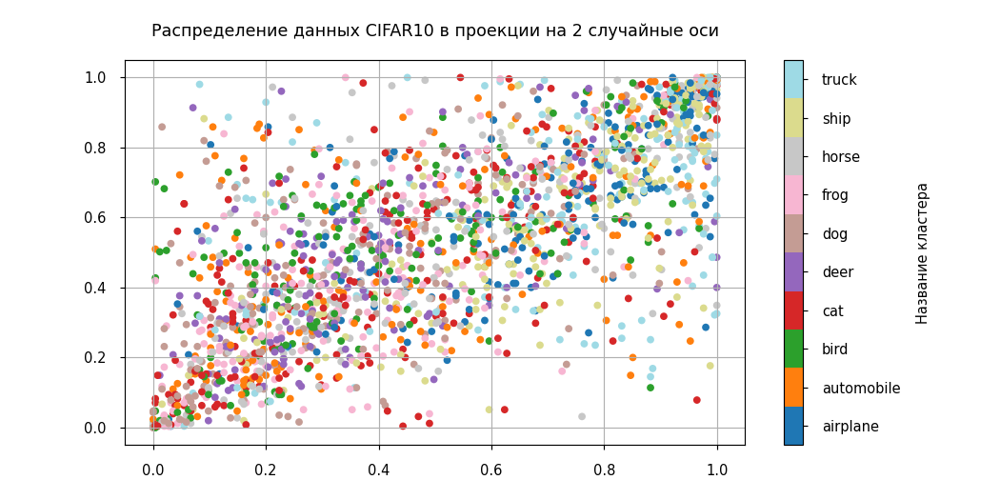

In [ ]:
# Если картинка окажется слишком маленькой/большой, то поменяйте image_scale на подходящее значение
plot_interactive(
    cifar10_data_train[:, [17, 64]], cifar10_images_train, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [ ]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

#### <font color='orange'>**Задание 2.1 [кросспроверка, 2 балла][код]**
<a id='task_2.1'></a></font>
Воспользуйтесь алгоритмами снижения размерности `TSNE`, `UMAP`, `Isomap`, `KernelPCA` для визуализации картинок.

Постройте визуализацию низкоразмерного представления, полученного с помощью этих моделей — изобразите четыре графика в одной строке. Во второй строке отобразите результат применения обученных моделей на тестовой выборке. Если для данного алгоритма невозможно сделать предсказания на тестовой выборке — оставьте соответствующий график пустым. Обозначьте разными цветами разные классы объектов. Для повышения производительности можете отобразить только часть выборки на графике ($1000\text{-}2000$ объектов).

*Замечание:* обратите внимание, что все алгоритмы снижения размерности также требуют правильного масштабирования признаков, для корректной работы и интерпретируемых результатов.

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
cifar10_data_train_scaled = StandardScaler().fit_transform(cifar10_data_train)
cifar10_data_test_scaled = StandardScaler().fit_transform(cifar10_data_test)

tsne_transform = TSNE().fit_transform(cifar10_data_train_scaled)
kernelpca = KernelPCA().fit(cifar10_data_train_scaled)
isomap = Isomap().fit(cifar10_data_train_scaled)
umap = UMAP().fit(cifar10_data_train_scaled)

In [ ]:
def plot(data, labels, title, names, ax, n_dots=1000):
    ax.grid(True)
    n_clusters = len(np.unique(labels))
    scatter = ax.scatter(data[:n_dots, 0], data[:n_dots, 1], c=labels[:n_dots], cmap=plt.get_cmap('tab20', n_clusters), edgecolors='none')
    cbar = plt.colorbar(scatter, ax=ax, label='Название кластера')
    cbar.set_ticks(np.min(labels[:n_dots]) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(names)
    ax.set_title(title)

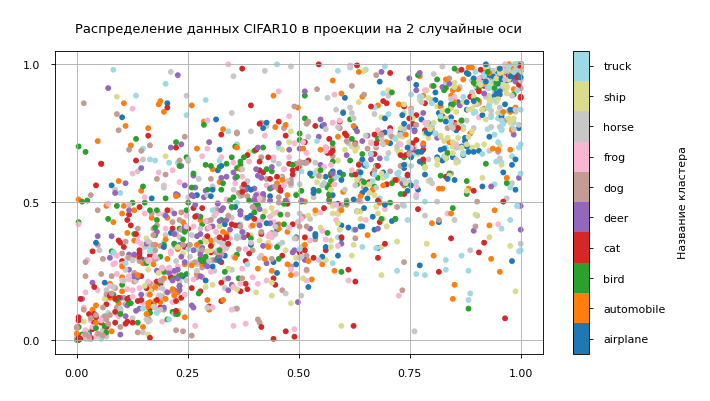

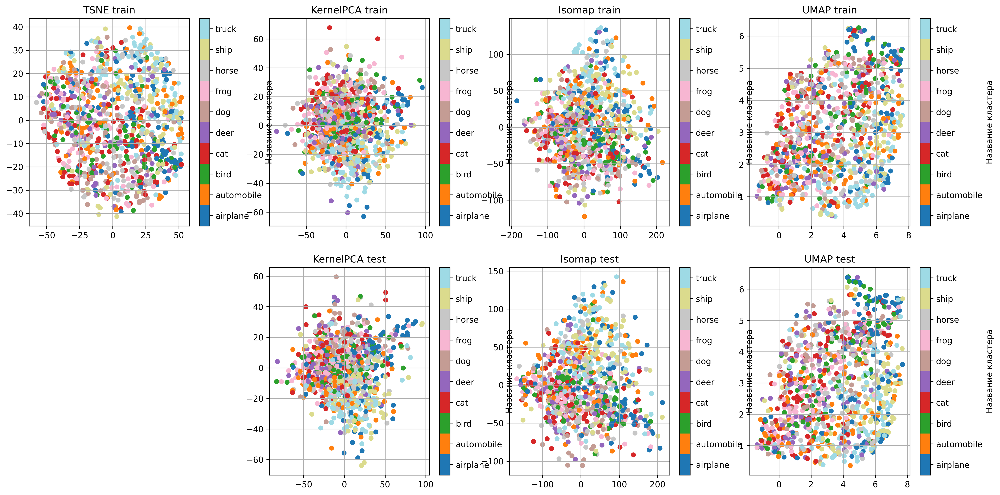

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

plot(tsne_transform, cifar10_labels_train, 'TSNE train', cifar10_test_dataset.classes, ax[0, 0])
plot(kernelpca.transform(cifar10_data_train_scaled), cifar10_labels_train, 'KernelPCA train', cifar10_test_dataset.classes, ax[0, 1])
plot(isomap.transform(cifar10_data_train_scaled), cifar10_labels_train, 'Isomap train', cifar10_test_dataset.classes, ax[0, 2])
plot(umap.transform(cifar10_data_train_scaled), cifar10_labels_train, 'UMAP train', cifar10_test_dataset.classes, ax[0, 3])
ax[1, 0].axis('off')
plot(kernelpca.transform(cifar10_data_test_scaled), cifar10_labels_test, 'KernelPCA test', cifar10_test_dataset.classes, ax[1, 1])
plot(isomap.transform(cifar10_data_test_scaled), cifar10_labels_test, 'Isomap test', cifar10_test_dataset.classes, ax[1, 2])
plot(umap.transform(cifar10_data_test_scaled), cifar10_labels_test, 'UMAP test', cifar10_test_dataset.classes, ax[1, 3])

plt.show()

#### <font color='orange'>**Задание 2.2 [кросспроверка, 3 балла][вопрос]**</font>
Опишите увиденное. Почему алгоритмы могли отработать не так, как вы ожидали?

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)
Алгоритмы, конечно, выполнили свою задачу по снижению размерности данных, однако результаты кластеризации оставляют желать лучшего. Возможно, это связано с тем, что данные не могут быть адекватно представлены на двухмерной плоскости, либо же просто исходные кластеры имеют сложную структуру и объекты в них расположены хаотично.

#### <font color='orange'>**Задание 2.3 [кросспроверка, 2 балла][вопрос]**</font>
Методы снижения размерности, как и другие метрические методы испытывают трудности при работе с данными высокой размерности. Напишите как минимум две причины, почему.

<font color='magenta'>*Ваш ответ здесь:*</font>(ｏ・_・)ノ”(ノ_<、)

Необходимы большие затраты памяти

Необходимы большие временные затраты

Один из способов решения этих проблем — перейти в другое, более репрезентативное пространство признаков, где объекты будут расположены в многообразии, которое легче представить в двумерном пространстве. Чтобы выполнить такое преобразование воспользуемся типичным подходом **Transfer Learning** — предобученными нейронными сетями. С помощью глубокой сети обученной на другом наборе изображений (`ImageNet`) мы перейдём в новое векторное пространство и затем применим методы снижения размерности.

Так как локальный подсчёт эмбеддингов изображений может занять много времени, Вы можете попробовать скачать их из [проверяющей системы](https://cv-gml.ru/), или через `gdown`:

In [ ]:
gdown.download(id='16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-', output='cifar10_deep_features.npy')

Downloading...
From (original): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-
From (redirected): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-&confirm=t&uuid=8ee7b2e9-696b-4b58-8d29-0910aa551817
To: /content/cifar10_deep_features.npy
100%|██████████| 164M/164M [00:00<00:00, 166MB/s]


'cifar10_deep_features.npy'

In [ ]:
FEATURES_PATH = './cifar10_deep_features.npy'

if not os.path.exists(FEATURES_PATH):
    deep_cnn = InceptionV3(weights='imagenet', include_top=False, input_shape=(139, 139, 3))

    cifar10_tensors_test = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_test.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)
    cifar10_tensors_train = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_train.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)

    cifar10_deep_features_test = deep_cnn.predict(
        preprocess_input(cifar10_tensors_test)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_test.shape[0], -1])
    cifar10_deep_features_train = deep_cnn.predict(
        preprocess_input(cifar10_tensors_train)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_train.shape[0], -1])

    np.save(FEATURES_PATH, [cifar10_deep_features_test, cifar10_deep_features_train])
else:
    cifar10_deep_features_test, cifar10_deep_features_train = np.load(FEATURES_PATH, allow_pickle=True)

#### <font color='orange'>**Задание 2.4 [кросспроверка, 4 балла][код]**</font>
Используйте выделенные признаки для обучения алгоритмов из предыдущего пункта. Постройте графики. Замечание из пункта [**2.1**](#task_2.1) остаётся в силе.

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
cifar10_deep_features_train_scaled = StandardScaler().fit_transform(cifar10_deep_features_train)
cifar10_deep_features_test_scaled = StandardScaler().fit_transform(cifar10_deep_features_test)

tsne_transform = TSNE().fit_transform(cifar10_deep_features_train_scaled)
kernelpca = KernelPCA().fit(cifar10_deep_features_train_scaled)
isomap = Isomap().fit(cifar10_deep_features_train_scaled)
umap = UMAP().fit(cifar10_deep_features_train_scaled)

fig, ax = plt.subplots(2, 4, figsize=(20, 10))
plot(tsne_transform, cifar10_labels_train, 'TSNE train', cifar10_test_dataset.classes, ax[0, 0])
plot(kernelpca.transform(cifar10_deep_features_train_scaled), cifar10_labels_train, 'KernelPCA train', cifar10_test_dataset.classes, ax[0, 1])
plot(isomap.transform(cifar10_deep_features_train_scaled), cifar10_labels_train, 'Isomap train', cifar10_test_dataset.classes, ax[0, 2])
plot(umap.transform(cifar10_deep_features_train_scaled), cifar10_labels_train, 'UMAP train', cifar10_test_dataset.classes, ax[0, 3])

ax[1, 0].axis('off')
plot(kernelpca.transform(cifar10_deep_features_test_scaled), cifar10_labels_test, 'KernelPCA test', cifar10_test_dataset.classes, ax[1, 1])
plot(isomap.transform(cifar10_deep_features_test_scaled), cifar10_labels_test, 'Isomap test', cifar10_test_dataset.classes, ax[1, 2])
plot(umap.transform(cifar10_deep_features_test_scaled), cifar10_labels_test, 'UMAP test', cifar10_test_dataset.classes, ax[1, 3])

plt.show()

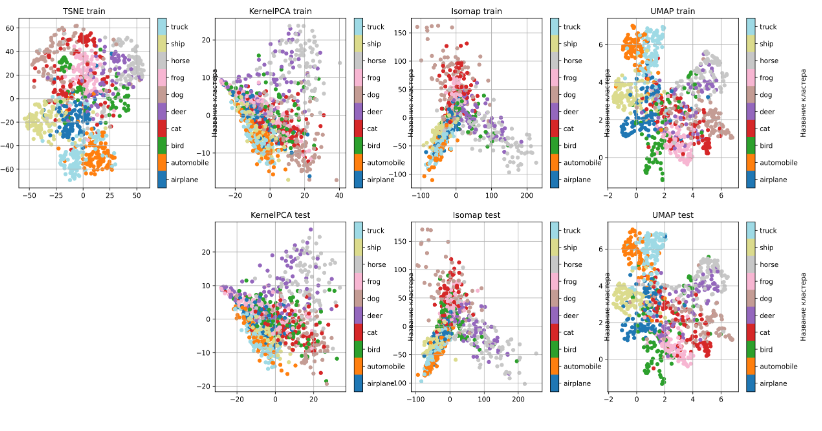

#### <font color='orange'>**Задание 2.5 [кросспроверка, 3 балла][вопрос]**</font>
1. Есть ли какие-то изменения по сравнению с использованием исходных признаков?
2. Как вы думаете, почему использование глубоких признаков помогло/не помогло в задаче снижения размерности?
3. Какой алгоритм показал себя лучше на ваш взгляд?
4. Согласованы ли преобразования на обучающей и тестовых выборках? Какие недостатки есть в том, что преобразование на тестовой выборке выглядит отлично от низкоразмерного представления обучающей выборки?
5. Какие из алгоритмов можно использовать в качестве первого шага по снижению размерности в задачах машинного обучения? Какой из них использовали бы вы?

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)

После применения эмбеддингов при снижении размерности кластеры стали лучше разделяться по сравнению с исходными данными.

Глубокие признаки оказались полезными, так как они отражают информативные характеристики объектов, а не просто набор пикселей.

На мой взгляд, алгоритм UMAP лучше всего справился с задачей понижения размерности.

Преобразования на обучающей и тестовых выборках в целом схожи. Если преобразование тестовой выборки сильно отличается от низкоразмерного представления обучающей выборки, то это может свидетельствовать о переобучении или недообучении метода.

Все представленные алгоритмы могут быть использованы в качестве первого шага по снижению размерности в задачах машинного обучения. Лично я бы выбрал метод UMAP, так как он быстро обучается и показывает результаты немного лучше, чем остальные алгоритмы.

Далее, для визуализации кластеризации используйте один из методов снижения размерности на ваш выбор и то векторное представление, которое лучше всего себя проявило (исходное или полученное с помощью глубокой сети). Кластеризацию обучайте также на наиболее подходящем высокоразмерном векторном представлении.

#### <font color='orange'>**Задание 2.6 [кросспроверка, 2 балла][код, вопрос]**</font>
Изобразите выборку CIFAR10 с помощью выбранного алгоритма снижения размерности.

*Совет*: Изобразите результат с помощью `plot_interactive`, чтобы изучить особенности кластеризации в соответствии с исходными изображениями. Если вы нашли интересные особенности — напишите про это.

In [ ]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
cifar10_deep_features_train_scaled = StandardScaler().fit_transform(cifar10_deep_features_train)

plot_interactive(
    umap.transform(cifar10_deep_features_train_scaled), cifar10_images_train, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [ ]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

Теперь, когда мы можем визуализировать кластеризацию, можно сравнить алгоритмы из первой части на естественных данных.

#### <font color='orange'>**Задание 2.7 [кросспроверка, 3 балла][код]**</font>
Подберите параметры `KMeans`, `DBSCAN`, `AgglomerativeClustering` используя силуэт и B-Cubed. Визуализируйте получившиеся кластеризации также, как и в задании [**1.с.4**](#task_1.c.4). Для ускорения перебора можете производить его на небольшой доле от всех объектов ($1000\text{-}2000$ объектов).

*Замечание:* Алгоритмы кластеризации нужно применять к исходному векторному представлению. Снижение размерности используется только для визуализации.

In [ ]:
n_objects = 2000

In [ ]:
# Ваш код здесь:＼(º □ º l|l)/
cifar10_deep_features_train_scaled = StandardScaler().fit_transform(cifar10_deep_features_train)

n_clusters = [col for col in range(1, 20)]
sil_scores = []
bcubed_scores = []
for i in n_clusters:
    res = KMeans(n_clusters=i, n_init=10).fit_predict(cifar10_deep_features_train_scaled[:n_objects])
    sil_scores.append(silhouette_score(cifar10_deep_features_train_scaled[:n_objects], res))
    bcubed_scores.append(bcubed_score(cifar10_labels_train[:n_objects], res))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


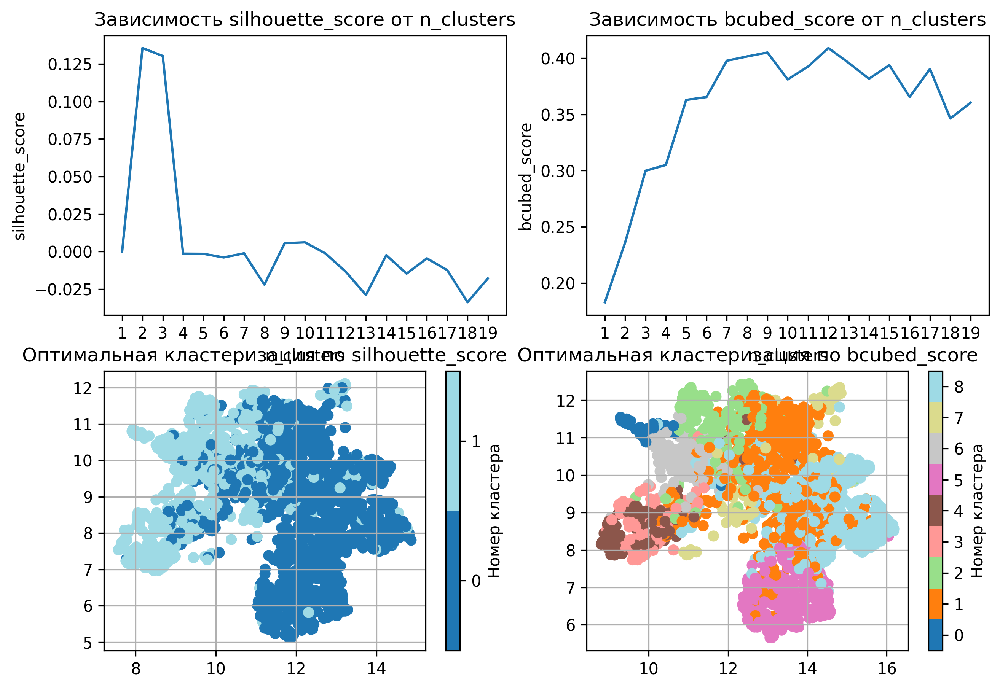

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(10, 7))
ax[0, 0].plot(n_clusters, sil_scores)
ax[0, 0].set_title('Зависимость silhouette_score от n_clusters')
ax[0, 0].set_xlabel('n_clusters')
ax[0, 0].set_ylabel('silhouette_score')
ax[0, 0].set_xticks(n_clusters)

ax[0, 1].plot(n_clusters, bcubed_scores)
ax[0, 1].set_title('Зависимость bcubed_score от n_clusters')
ax[0, 1].set_xlabel('n_clusters')
ax[0, 1].set_ylabel('bcubed_score')
ax[0, 1].set_xticks(n_clusters)

plot_2d_data(UMAP().fit_transform(cifar10_deep_features_train_scaled[:n_objects]), KMeans(n_clusters=2).fit_predict(cifar10_deep_features_train_scaled[:n_objects]), title='Оптимальная кластеризация по silhouette_score', ax=ax[1,0])
plot_2d_data(UMAP().fit_transform(cifar10_deep_features_train_scaled[:n_objects]), KMeans(n_clusters=9).fit_predict(cifar10_deep_features_train_scaled[:n_objects]), title='Оптимальная кластеризация по bcubed_score', ax=ax[1,1])

plt.show()

In [ ]:
eps = np.linspace(start=14, stop=19, num=20)
min_samples = [n for n in range(1, 21)]

sil_scores = []
bcubed_scores = []
for i, ms in enumerate(min_samples):
    sil_scores.append([])
    bcubed_scores.append([])
    for j in eps:
        res = DBSCAN(eps=j, min_samples=ms).fit_predict(cifar10_deep_features_train_scaled[:n_objects])
        sil_scores[i].append(silhouette_score(cifar10_deep_features_train_scaled[:n_objects], res))
        bcubed_scores[i].append(bcubed_score(cifar10_labels_train[:n_objects], res))

def plot_heatmap(data, labels_x, labels_y, ax, bar_text):
    data = np.array(data)
    im = ax.imshow(data)
    ax.set_xticks(np.arange(data.shape[1]), labels=labels_x)
    ax.set_yticks(np.arange(data.shape[0]), labels=labels_y)
    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel(bar_text, va="bottom")
    plt.setp(ax.get_xticklabels(), rotation=-90, ha="right")

fig, ax = plt.subplots(2, 2, figsize=(10, 7))
plot_heatmap(sil_scores, eps, min_samples, ax[0, 0], 'silhouette_score')
plot_heatmap(bcubed_scores, eps, min_samples, ax[0, 1], 'bcubed_score')
plot_2d_data(UMAP().fit_transform(cifar10_deep_features_train_scaled[:n_objects]), DBSCAN(eps=14.26, min_samples=19).fit_predict(cifar10_deep_features_train_scaled[:n_objects]), title='визуализация оптимальной кластеризации по silhouette_score', ax=ax[1,0])
plot_2d_data(UMAP().fit_transform(cifar10_deep_features_train_scaled[:n_objects]), DBSCAN(eps=15.84, min_samples=10).fit_predict(cifar10_deep_features_train_scaled[:n_objects]), title='визуализация оптимальной кластеризации по bcubed_score', ax=ax[1,1])
plt.show()

KeyboardInterrupt: 

In [ ]:
n_clusters = [col for col in range(1, 20)]
sil_scores = []
bcubed_scores = []
for i in n_clusters:
    res = AgglomerativeClustering(n_clusters=i).fit_predict(cifar10_deep_features_train_scaled[:n_objects])
    sil_scores.append(silhouette_score(cifar10_deep_features_train_scaled[:n_objects], res))
    bcubed_scores.append(bcubed_score(cifar10_labels_train[:n_objects], res))

fig, ax = plt.subplots(2, 2, figsize=(10, 7))
ax[0, 0].plot(n_clusters, sil_scores)
ax[0, 0].set_title('Зависимость silhouette_score от n_clusters')
ax[0, 0].set_xlabel('n_clusters')
ax[0, 0].set_ylabel('silhouette_score')
ax[0, 0].set_xticks(n_clusters)

ax[0, 1].plot(n_clusters, bcubed_scores)
ax[0, 1].set_title('Зависимость bcubed_score от n_clusters')
ax[0, 1].set_xlabel('n_clusters')
ax[0, 1].set_ylabel('bcubed_score')
ax[0, 1].set_xticks(n_clusters)
plot_2d_data(UMAP().fit_transform(cifar10_deep_features_train_scaled[:n_objects]), AgglomerativeClustering(n_clusters=2).fit_predict(cifar10_deep_features_train_scaled[:n_objects]), title='визуализация оптимальной кластеризации по silhouette_score', ax=ax[1,0])
plot_2d_data(UMAP().fit_transform(cifar10_deep_features_train_scaled[:n_objects]), AgglomerativeClustering(n_clusters=8).fit_predict(cifar10_deep_features_train_scaled[:n_objects]), title='визуализация оптимальной кластеризации по bcubed_score', ax=ax[1,1])

plt.show()

#### <font color='orange'>**Задание 2.8 [кросспроверка, 3 балла][вопрос]** </font>
1. Какие алгоритмы справились с кластеризацией естественных данных?
2. Получилось ли подобрать оптимальное число кластеров с помощью BCubed и коэффициента силуэта?
3. Объясните почему коэффициент силуэта не позволил выполнить подбор оптимальных гиперпараметров.

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)

С кластеризацией естественных данных успешно справились только алгоритмы KMeans и AgglomerativeClustering.

Удалось оптимизировать параметры для метрики BCubed, однако коэффициент силуэта не показал хороших результатов при подборе оптимальных гиперпараметров. Это произошло потому, что коэффициент силуэта является внутренней метрикой, которая использует евклидову метрику, но в нашем случае, в пространстве большой размерности, метрические алгоритмы работают неэффективно.

Таким образом, при кластеризации естественных данных необходимо использовать другие подходы для оптимизации гиперпараметров, а не только метрические алгоритмы.

Интересный способ визуализации Иерархической кластеризации — построение дендрограммы. Такой способ визуализации позволяет анализировать, как именно связаны между собой объекты, подбирать оптимальное число кластеров, а также определять, какие классы отделяются "хорошо" от других классов, а какие классы перемешаны в одном кластере.

In [ ]:
def plot_dendrogram(model, labels, classes, ax):
    n_classes = len(classes)
    n_samples = len(model.labels_)
    n_u_connections = model.children_.shape[0]
    colors = plt.get_cmap('tab20', n_classes).colors

    bin_counts = np.zeros([n_u_connections, n_classes])
    for i, merge in enumerate(model.children_):
        current_bin_count = np.zeros(n_classes)
        for child_idx in merge:
            if child_idx < n_samples:
                current_bin_count[labels[child_idx]] += 1
            else:
                current_bin_count += bin_counts[child_idx - n_samples]

        bin_counts[i] = current_bin_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, np.sum(bin_counts, axis=1)]
    ).astype(float)

    def leaf_label_func(idx):
        if idx < len(labels):
            return None
        else:
            ratio = 100 * np.max(bin_counts[idx - n_samples]) / np.sum(bin_counts[idx - n_samples])
            if ratio < 100:
                return '{0:.0f}%'.format(ratio)
            else:
                return None

    def link_color_func(idx):
        mode_class = np.argmax(bin_counts[idx - n_samples])
        return matplotlib.colors.to_hex(colors[mode_class], keep_alpha=True)

    scipy.cluster.hierarchy.dendrogram(
        linkage_matrix, ax=ax, link_color_func=link_color_func, leaf_label_func=leaf_label_func,
        orientation='right', truncate_mode="level", p=9
    )

    for idx, class_name in enumerate(classes):
        ax.plot([], [], c=matplotlib.colors.to_hex(colors[idx], keep_alpha=True), label=class_name)
    ax.legend()

    # Удалим накладывающиеся метки
    threshold = 55
    prev_position = -(threshold + 1)

    y_labels = ax.get_yaxis().get_ticklabels()
    for label in y_labels:
        if label.get_text() == '':
            continue

        _, position = label.get_position()
        if position - prev_position < threshold:
            label.set_text('')
        else:
            prev_position = position
    ax.get_yaxis().set_ticklabels(y_labels)

    ax.set_xlabel('Расстояние между кластерами')
    ax.set_ylabel('Доля объектов наибольшего класса в данном кластере')

    ax.set_title('Дендрограмма Иерархической Кластеризации')

In [ ]:
n_objects = 2000
model = AgglomerativeClustering(
    n_clusters=None, distance_threshold=0.0, compute_distances=True, compute_full_tree=True
)
model = model.fit(cifar10_deep_features_train[:n_objects])

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

plot_dendrogram(
    model,
    labels=cifar10_labels_train[:n_objects],
    classes=cifar10_train_dataset.classes,
    ax=ax
)

fig.tight_layout()
plt.show()

#### <font color='orange'>**Задание 2.9 [вопрос]** </font>

Проанализируйте получившуюся дендрограмму. Напишите свои наблюдения ниже.

<font color='magenta'>*Ваш ответ здесь:*</font> (ｏ・_・)ノ”(ノ_<、)